INCOME,EDUCATION,PROPERTY PRICE,COMPLAINTS

In [230]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.stats import pearsonr
from sklearn import preprocessing
import datetime
import seaborn as sns
%matplotlib inline
sns.set()

In [2]:
def normalize(df):
    df2 = df.copy()
    for col in df2.columns:
        if col != 'zip_code' and col!= 'date' and col!='year' and col!='month_of_year' and col!= 'month':
            
            mean = np.mean(df2[col])
            std = np.std(df2[col])
            df2[col] = (df2[col]-mean)/std
    return df2


def extract_month(df): #also drops zip code
    df_month = df.copy()
    dates = list(df_month['date'])
    months = [str(x)[5:7] for x in dates]
    df_month['month'] = months
    df_month.drop('date',axis = 1, inplace = True)
    df_month.drop('zip_code',axis = 1, inplace = True)
    return df_month



def remove_null(df):
    for col in df.columns:
        df = df[pd.notnull(df[col])]
    return df


def corrMat(corr,label):
    ax = plt.axes()


    sns.heatmap(corr, 
            xticklabels=corr.columns.values,
            yticklabels=corr.columns.values,
            ax = ax)
    ax.set_title(label)
    plt.savefig(label)
    plt.show()
    



def corr_by_zip(df1,df2,mutual_zip ,tol = 0.5,print_all = False):
    
    #NOTE: ALL ZIP IN DF NEEDS TO BE STRING
    df1['zip_code'] = df1['zip_code'].astype('str')
    df2['zip_code'] = df2['zip_code'].astype('str')
    df1['year'] = df1['year'].astype('str')
    df2['year'] = df2['year'].astype('str')
    i = 0
    zipcode = []
    var1 = []
    var2 = []
    corr = []
    for zc in np.array(mutual_zip).astype(str):
        i+=1
        if i%10 == 0:
            print(i)
        df1_sub = df1.loc[df1['zip_code']==zc]
        df2_sub = df2.loc[df2['zip_code']==zc]

        df1_sub.drop(['zip_code'],axis = 1, inplace = True)
        df2_sub.drop(['zip_code'],axis = 1, inplace = True)

        for col1 in df1_sub.columns:
            for col2 in df2_sub.columns:
                
                if col1!='year' and col2 != 'year':
                    new = df1_sub[['year',col1]].merge(df2_sub[['year',col2]],'inner','year')
                    yr = new['year']
                    new.drop('year',axis = 1, inplace = True)
                    
                else:
                    continue
                corr1 = np.corrcoef(np.array(new.iloc[:,0]),np.array(new.iloc[:,1]))[0][1]
                if print_all:
                    print (zc, col1, col2, corr1)
                else:
                    if np.abs(corr1) >tol:
                        print (zc,col1, col2, corr1)
                        zipcode.append(zc)
                        var1.append(col1)
                        var2.append(col2)
                        corr.append(corr1)
        
                        
#for year/month
def corr_by_zip2(df1,df2,mutual_zip ,tol = 0.5,print_all = False):
    
    #NOTE: ALL ZIP IN DF NEEDS TO BE STRING
    df1['zip_code'] = df1['zip_code'].astype('str')
    df2['zip_code'] = df2['zip_code'].astype('str')
    df1['month'] = df1['month'].astype('str')
    df2['month'] = df2['month'].astype('str')
    i = 0
    for zc in np.array(mutual_zip).astype(str):
        i+=1
        if i%10 == 0:
            print(i)
        df1_sub = df1.loc[df1['zip_code']==zc]
        df2_sub = df2.loc[df2['zip_code']==zc]

        df1_sub.drop(['zip_code'],axis = 1, inplace = True)
        df2_sub.drop(['zip_code'],axis = 1, inplace = True)

        for col1 in df1_sub.columns:
            for col2 in df2_sub.columns:
                
                if col1!='month' and col2 != 'month':
                    new = df1_sub[['month',col1]].merge(df2_sub[['month',col2]],'inner','month')
                    yr = new['month']
                    new.drop('month',axis = 1, inplace = True)
                    
                else:
                    continue
                corr1 = np.corrcoef(np.array(new.iloc[:,0]),np.array(new.iloc[:,1]))[0][1]
                if print_all:
                    print (zc, col1, col2, corr1)
                else:
                    if np.abs(corr1) >tol:
                        print (zc,col1, col2, corr1)
                        
                        
def corr_by_year(df1,df2,mutual_year ,tol = 0.5,print_all = False):
    
    #NOTE: ALL ZIP IN DF NEEDS TO BE STRING
    df1['zip_code'] = df1['zip_code'].astype('str')
    df2['zip_code'] = df2['zip_code'].astype('str')
    df1['year'] = df1['year'].astype('str')
    df2['year'] = df2['year'].astype('str')
    i = 0
    for zc in np.array(mutual_year).astype(str):
        i+=1
        if i%10 == 0:
            print(i)
        df1_sub = df1.loc[df1['year']==zc]
        df2_sub = df2.loc[df2['year']==zc]

        df1_sub.drop(['year'],axis = 1, inplace = True)
        df2_sub.drop(['year'],axis = 1, inplace = True)

        for col1 in df1_sub.columns:
            for col2 in df2_sub.columns:
                
                if col1!='zip_code' and col2 != 'zip_code':
                    new = df1_sub[['zip_code',col1]].merge(df2_sub[['zip_code',col2]],'inner','zip_code')
                    zipc = new['zip_code']
                    new.drop('zip_code',axis = 1, inplace = True)
                    
                else:
                    continue
                corr1 = np.corrcoef(np.array(new.iloc[:,0]),np.array(new.iloc[:,1]))[0][1]
                if print_all:
                    print (zc, col1, col2, corr1)
                else:
                    if np.abs(corr1) > tol:
                        print (zc, col1, col2, corr1)
  

Those four datasets are evaluated with zip_code => on the year scale
Complaint needs to group by year
Property needs to group by year

RUN CODE BELOW

In [110]:
property_y = pd.read_csv("property_full.csv")
income = pd.read_csv("income.csv")
education = pd.read_csv("education.csv")
complaints = pd.read_csv("complaints.csv")
crime = pd.read_csv("crime_full.csv")

/anaconda3/lib/python3.6/site-packages/IPython/core/interactiveshell.py:2698: DtypeWarning: Columns (4) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


In [111]:
income.drop('total_with_income', axis = 1, inplace = True)

In [112]:
property_y = remove_null(property_y)
income = remove_null(income)
education = remove_null(education)
complaints = remove_null(complaints)
crime = remove_null(crime)

In [113]:
complaints_month = complaints[['month','zip_code','complaint_count']]
crime_month = crime.copy()

In [114]:
crime = crime_full[['month','zip_code','FELONY','MISDEMEANOR','VIOLATION']]
df_year = crime.copy()
dates = list(df_year['month'])
years = [str(x)[:4] for x in dates]
df_year['year'] = years
crime_year = df_year.copy()
crime_year.drop('month',axis = 1, inplace = True)
#group by year
crime_year = crime_year.groupby(['year','zip_code'],as_index = False).sum()
crime_year.head()
crime_year.columns = ['year', 'zip_code','FELONY', 'MISDEMEANOR', 'VIOLATION']

In [246]:
crime_year.head()

,year,zip_code,FELONY,MISDEMEANOR,VIOLATION
0,2011,83,164,323,54
1,2011,10001,2156,5225,350
2,2011,10002,1322,3016,508
3,2011,10003,1586,3143,374
4,2011,10004,143,262,36


In [115]:
#Extract year info in property
df_year = property_y.copy()
dates = list(df_year['year'])
years = [str(x)[:2] + str(x)[5:7] for x in dates]
df_year['year'] = years
property_year = df_year.copy()
#group by year
property_year = property_year.groupby(['year','zip_code'],as_index = False).mean()
len(property_year.year)

1598

In [116]:
complaints_new = complaints[['month','zip_code','complaint_count']]
complaints_new.head()

,month,zip_code,complaint_count
0,2013/11,11568,1
1,2013/1,10314,1
2,2013/8,11105,2
3,2013/11,10019,2
4,2013/2,11004,1


In [117]:
df_year = complaints_new.copy()
dates = list(df_year['month'])
years = [str(x)[:4] for x in dates]
df_year['year'] = years
df_year.drop('month',axis = 1, inplace = True)
complaints_year = df_year.copy()
complaints_year = complaints_year.groupby(['year','zip_code'],as_index = False).mean()
complaints_year.columns = ['year','zip_code','comp_count']
len(complaints_year.year)

4642

In [118]:
#Find mutual zipcode
complaints_year['zip_code'] = complaints_year['zip_code'].astype(str)
property_year['zip_code'] = property_year['zip_code'].astype(str)
mutzip1 = set(list(crime_year['zip_code'].astype(str))) & set(list(complaints_year['zip_code'].astype(str))) & set(list(property_year['zip_code'].astype(str))) & set(list(income['zip_code'].astype(str))) & set(list(education['zip_code'].astype(str)))
mutzip1 = list(mutzip1)

mutyear = set(list(crime_year['year'])) & set(list(complaints_year['year'].astype(str))) & set(list(property_year['year'].astype(str))) & set(list(income['year'].astype(str))) & set(list(education['year'].astype(str)))
mutyear = list(mutyear)
complaints_year = complaints_year.loc[complaints_year['zip_code'].isin(mutzip1)]
property_year = property_year.loc[property_year['zip_code'].isin(mutzip1)]
income = income.loc[income['zip_code'].isin(mutzip1)]
education = education.loc[education['zip_code'].isin(mutzip1)]
crime_year = crime_year.loc[crime_year['zip_code'].isin(mutzip1)]

complaints_year = complaints_year.loc[complaints_year['year'].isin(mutyear)]
property_year = property_year.loc[property_year['year'].isin(mutyear)]
income = income.loc[income['year'].isin(mutyear)]
education = education.loc[education['year'].isin(mutyear)]
crime_year = crime_year.loc[crime_year['year'].isin(mutyear)]

In [119]:
complaints_month['zip_code'] = complaints_month['zip_code'].astype(str)
complaints_month = complaints_month.loc[complaints_month['zip_code'].isin(mutzip1)]
crime_month = crime_month.loc[crime_month['zip_code'].isin(mutzip1)]

/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """Entry point for launching an IPython kernel.


In [120]:
education = education[education.percent_high_school.str.contains('-') == False]
education.percent_high_school = education.percent_high_school.astype(float)
education = education[education.percent_bachelor.str.contains('-') == False]
education.percent_bachelor = education.percent_bachelor.astype(float)

education = education[education.median_earnings_high_school.apply(lambda x: x.isnumeric())]
education.median_earnings_high_school = education.median_earnings_high_school.astype(float)

education = education[education.median_earnings_bachelor.apply(lambda x: x.isnumeric())]
education.median_earnings_bachelor = education.median_earnings_bachelor.astype(float)

In [121]:
#Normalize dataset
complaints_year_n = normalize(complaints_year)
property_year_n = normalize(property_year)
income_n = normalize(income)
edu_n = normalize(education)
crime_year_n = normalize(crime_year)
#crime_month_n = normalize(crime_month)
#complaints_month_n = normalize(complaints_month)

In [123]:
edu_inc = education.merge(income,'inner',on = ['year','zip_code'])
edu_inc['year'] = edu_inc['year'].astype(str)
edu_inc['zip_code'] = edu_inc['zip_code'].astype(str)
property_year['year'] = property_year['year'].astype(str)
property_year['zip_code'] = property_year['zip_code'].astype(str)

eip = edu_inc.merge(property_year,'inner',on = ['year','zip_code'])

#eip.drop('total_with_income', axis = 1, inplace=True)

In [228]:
eip.head()

,year,zip_code,percent_high_school,percent_bachelor,median_earnings_high_school,median_earnings_bachelor,29999_less,30000_to_74999,75000_more,avg_market_val,avg_land_val,avg_total_val,min_market_val,min_land_val,min_total_val,max_market_val,max_land_val,max_total_val
0,2011,10001,91.4,66.4,25466.0,43208.0,0.000027,0.000023,0.000045,5.900805e+06,8.842979e+05,2.585099e+06,0.0,0.0,0.0,698700000.0,99000000.0,314415000.0
1,2011,10002,62.2,28.1,20160.0,32946.0,0.000015,0.000009,0.000007,1.701034e+06,2.801338e+05,6.810973e+05,0.0,0.0,0.0,247291650.0,111281243.0,111281243.0
2,2011,10003,95.5,75.8,38464.0,50775.0,0.000007,0.000009,0.000020,2.595515e+06,2.883234e+05,9.245300e+05,0.0,0.0,0.0,183000000.0,24615000.0,82350000.0
3,2011,10004,98.4,78.4,147763.0,61125.0,0.000080,0.000054,0.000555,7.147863e+06,1.334925e+06,3.194099e+06,0.0,0.0,0.0,304042000.0,121050000.0,136818900.0
4,2011,10005,97.9,85.9,47222.0,61875.0,0.000045,0.000064,0.000252,2.453044e+06,3.730803e+05,1.101878e+06,0.0,0.0,0.0,371111111.0,66600000.0,167000000.0


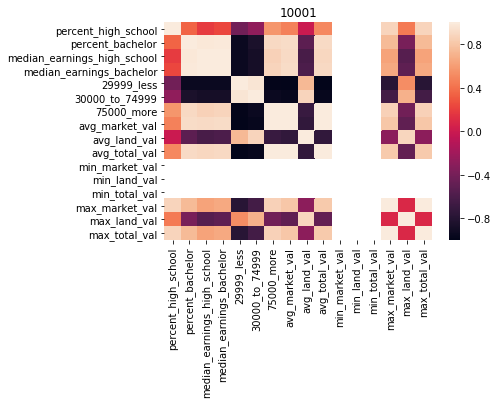

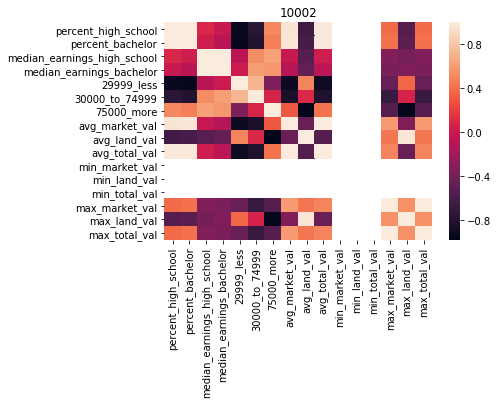

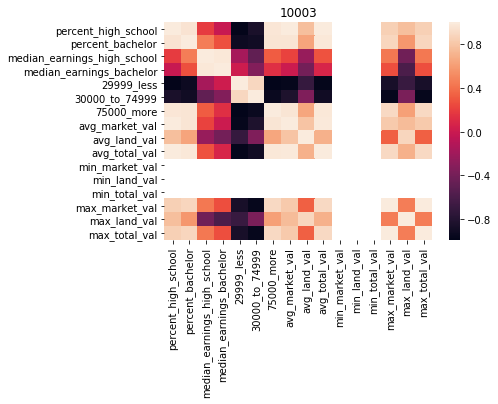

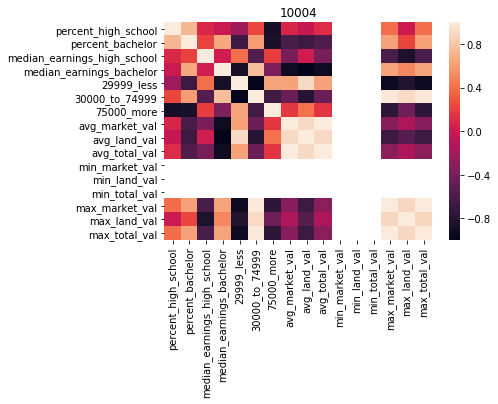

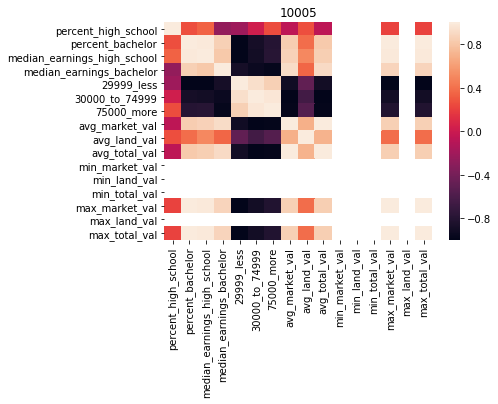

...

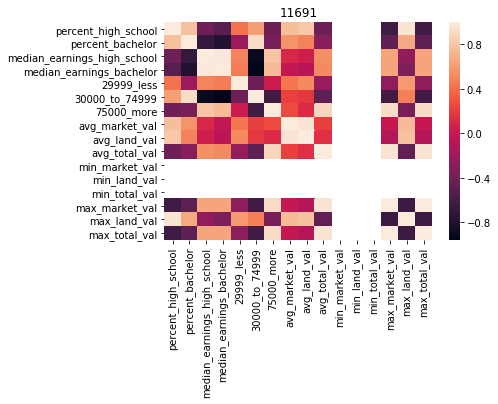

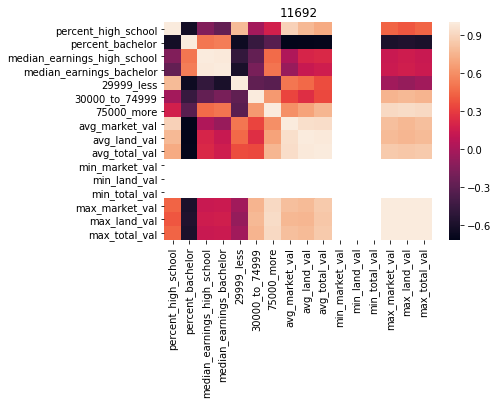

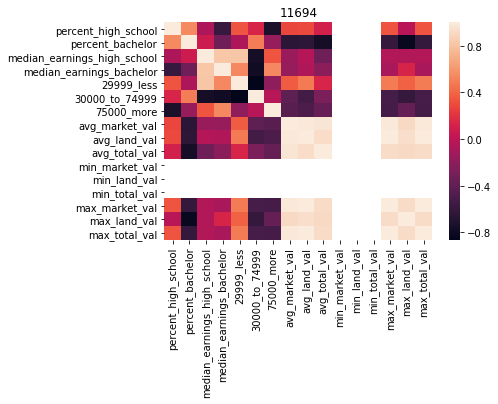

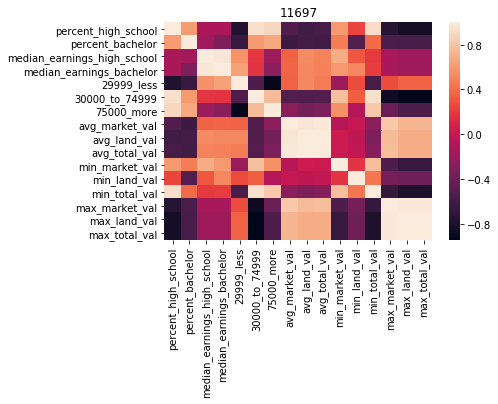

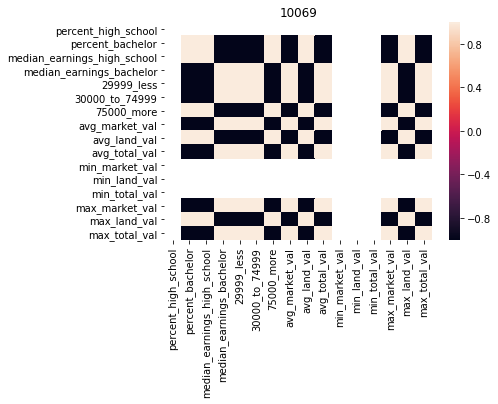

In [27]:
for zc in eip.zip_code.unique():
    eip_sub = eip[eip['zip_code'] == zc]
    corrMat(eip_sub.corr(),zc)

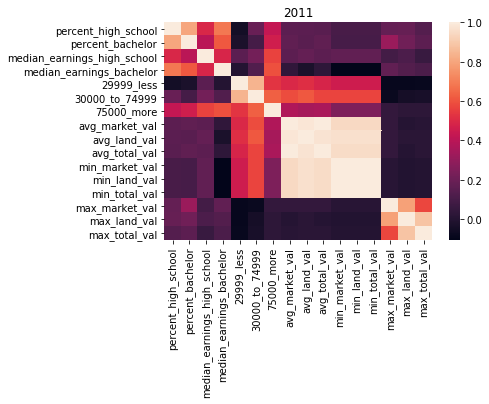

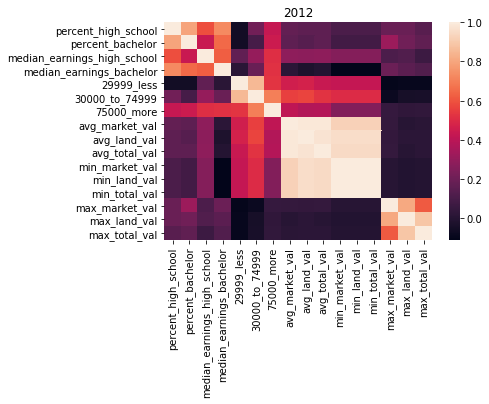

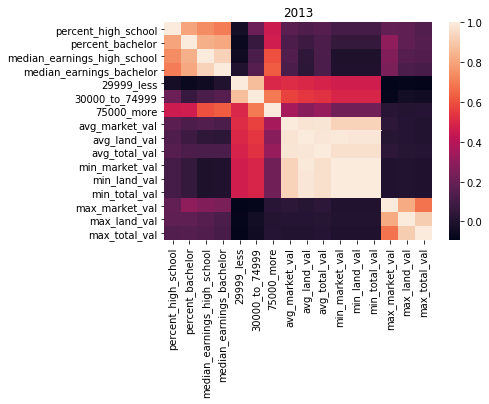

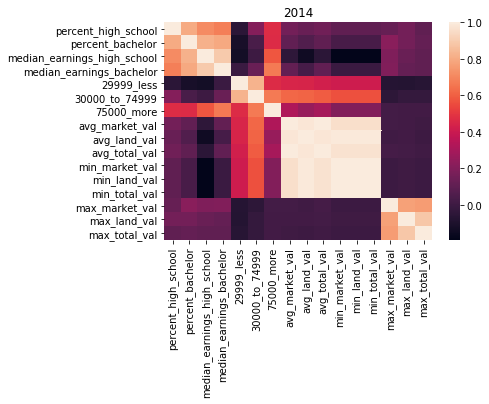

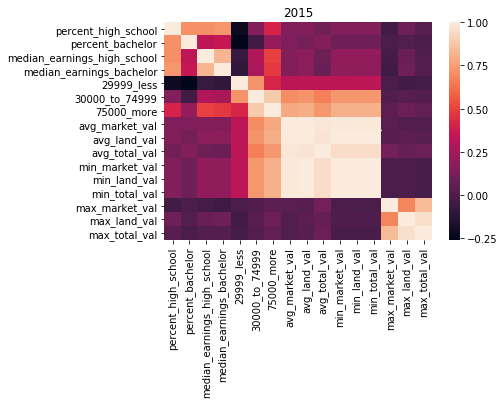

In [28]:
for yr in eip.year.unique():
    eip_sub = eip[eip['year'] == yr]
    corrMat(eip_sub.corr(),yr)

In [124]:
#correlation by zipcode

#income and education
inc_edu = corr_by_zip(income_n,edu_n,mutzip1,tol = 0.8)

/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:63: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:64: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


10461 29999_less median_earnings_high_school -0.861969411174
10461 75000_more percent_high_school 0.828847246344
10461 75000_more percent_bachelor 0.878906252744
10038 30000_to_74999 median_earnings_high_school -0.825950645029
10038 30000_to_74999 median_earnings_bachelor -0.843936054805
11372 30000_to_74999 median_earnings_high_school -0.884519369631
11372 30000_to_74999 median_earnings_bachelor -0.88638529421
10306 29999_less percent_bachelor 0.91867890689
10306 30000_to_74999 percent_bachelor -0.908505568674
10470 30000_to_74999 percent_bachelor -0.861812998591
10005 29999_less percent_high_school -0.802698439591
10005 30000_to_74999 percent_bachelor -0.868734455086
10005 30000_to_74999 median_earnings_high_school -0.917792824023
10005 75000_more percent_bachelor 0.934274718104
10005 75000_more median_earnings_high_school 0.971238664113
10452 29999_less percent_high_school 0.914698656908
10452 29999_less percent_bachelor 0.940529260605
10452 30000_to_74999 percent_high_school -0.917

11204 30000_to_74999 percent_bachelor -0.891672580176
11228 30000_to_74999 percent_bachelor -0.898579027416
11228 75000_more percent_bachelor 0.981309956776
10458 29999_less percent_high_school -0.975556655573
10458 29999_less percent_bachelor -0.816269791087
10458 30000_to_74999 percent_bachelor 0.932263381791
11237 29999_less percent_high_school -0.884622809264
11237 29999_less percent_bachelor -0.975541555224
11237 30000_to_74999 percent_bachelor -0.968717436318
11237 75000_more percent_high_school 0.813004457018
11237 75000_more percent_bachelor 0.999185657093
10280 29999_less percent_bachelor -0.987746567201
10280 29999_less median_earnings_bachelor 0.806073110729
10280 30000_to_74999 percent_high_school 0.819294504115
10280 30000_to_74999 median_earnings_high_school 0.999762381293
10280 30000_to_74999 median_earnings_bachelor 0.927911214646
10280 75000_more median_earnings_high_school -0.98758020719
10280 75000_more median_earnings_bachelor -0.969880380113
11422 75000_more percen

/anaconda3/lib/python3.6/site-packages/numpy/lib/function_base.py:3162: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/anaconda3/lib/python3.6/site-packages/numpy/lib/function_base.py:3163: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]



10034 75000_more percent_high_school 0.810940149626
11210 29999_less percent_bachelor -0.841821859999
11210 75000_more percent_bachelor 0.948277002075
11005 30000_to_74999 median_earnings_high_school -0.967465023919
11005 75000_more percent_bachelor 0.91155501933
11005 75000_more median_earnings_high_school 0.973098084982
11005 75000_more median_earnings_bachelor -0.82162059499
11206 29999_less percent_high_school -0.965214275574
11206 29999_less percent_bachelor -0.974482350499
11206 75000_more percent_high_school 0.985353056592
11206 75000_more percent_bachelor 0.992088805878
10069 29999_less percent_bachelor -1.0
10069 29999_less median_earnings_high_school -1.0
10069 29999_less median_earnings_bachelor 1.0
10069 30000_to_74999 percent_bachelor -1.0
10069 30000_to_74999 median_earnings_high_school -1.0
10069 30000_to_74999 median_earnings_bachelor 1.0
10069 75000_more percent_bachelor 1.0
10069 75000_more median_earnings_high_school 1.0
10069 75000_more median_earnings_bachelor -1.

11370 30000_to_74999 percent_bachelor -0.910782905375
11222 29999_less percent_high_school -0.905456240192
11222 29999_less percent_bachelor -0.971702189684
11222 30000_to_74999 percent_high_school -0.995137712491
11222 30000_to_74999 percent_bachelor -0.946822205643
11222 75000_more percent_high_school 0.97899827311
11222 75000_more percent_bachelor 0.972162349159
10011 29999_less percent_bachelor -0.964661587017
10011 29999_less median_earnings_high_school -0.970424085552
10011 29999_less median_earnings_bachelor -0.968014211434
10011 75000_more median_earnings_bachelor 0.85577973675
10029 30000_to_74999 percent_bachelor -0.898993537009
11205 29999_less percent_high_school -0.953553956566
11205 29999_less percent_bachelor -0.842082373803
11205 75000_more percent_bachelor 0.831003534298
11234 29999_less percent_bachelor -0.996795460761
140
10305 30000_to_74999 percent_high_school -0.955904574085
10305 30000_to_74999 percent_bachelor -0.988009261045
10305 75000_more percent_high_school

In [257]:
edu_inc = education.merge(income,'inner',on = ['year','zip_code'])
edu_inc['year'] = edu_inc['year'].astype(str)
edu_inc['zip_code'] = edu_inc['zip_code'].astype(str)
property_year['year'] = property_year['year'].astype(str)
property_year['zip_code'] = property_year['zip_code'].astype(str)

eip = edu_inc.merge(property_year,'inner',on = ['year','zip_code'])


In [179]:
#education, income, property by borough
borough = pd.read_csv("borough_zip.csv")
borough = remove_null(borough)
borough['zip_code'] = borough['zip_code'].astype(int).astype(str)
eip_borough = eip.merge(borough,'inner','zip_code')
eip_borough.drop('zip_code',axis = 1, inplace = True)

In [258]:
eip_borough = eip.merge(borough,'inner','zip_code')
eip_borough.drop('zip_code',axis = 1, inplace = True)

In [259]:
eip_borough_n = normalize(eip_borough)

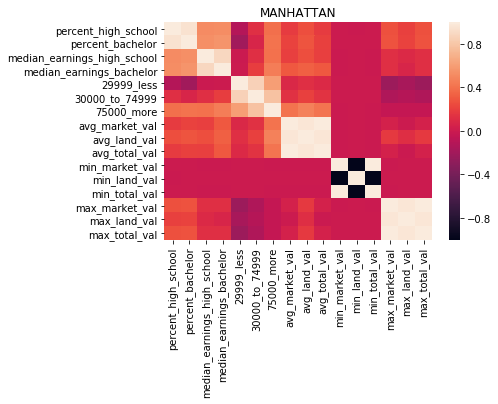

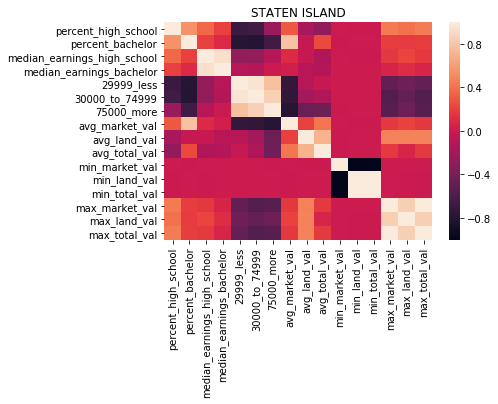

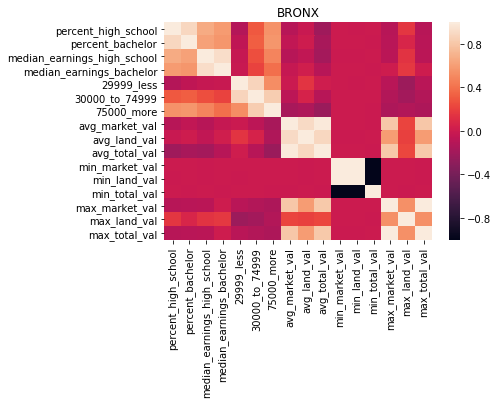

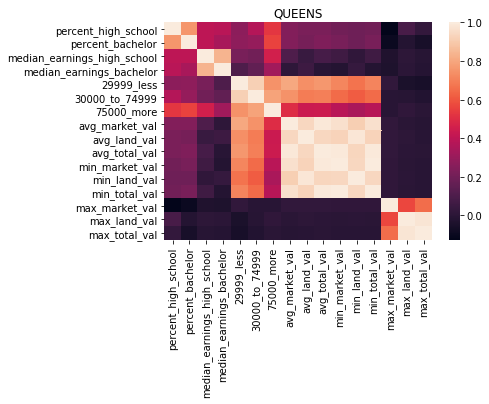

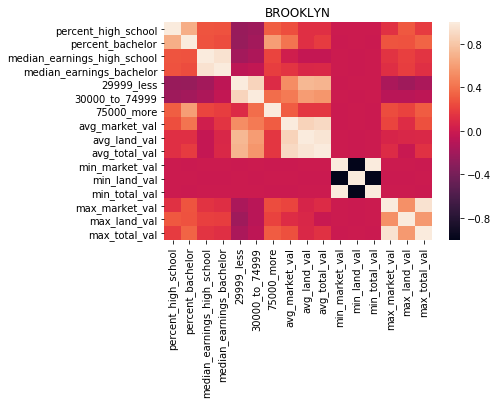

In [191]:
for b in eip_borough_n.borough.unique():
    cur = eip_borough_n[eip_borough_n['borough'] == b]
    corrMat(cur.corr(),b)

In [192]:
eip_borough_n.borough.unique()

array(['MANHATTAN', 'STATEN ISLAND', 'BRONX', 'QUEENS', 'BROOKLYN'], dtype=object)

In [201]:
eip_borough_n.borough.unique()
cur = eip_borough_n[eip_borough_n['borough'] == 'MANHATTAN']
cur.corr()[np.abs(cur.corr())>0.5]
    

,percent_high_school,percent_bachelor,median_earnings_high_school,median_earnings_bachelor,29999_less,30000_to_74999,75000_more,avg_market_val,avg_land_val,avg_total_val,min_market_val,min_land_val,min_total_val,max_market_val,max_land_val,max_total_val
percent_high_school,1.000000,0.949248,0.520160,0.523652,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
percent_bachelor,0.949248,1.000000,0.532054,0.558087,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
median_earnings_high_school,0.520160,0.532054,1.000000,0.896446,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
median_earnings_bachelor,0.523652,0.558087,0.896446,1.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
29999_less,NaN,NaN,NaN,NaN,1.000000,0.862455,0.608457,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
30000_to_74999,NaN,NaN,NaN,NaN,0.862455,1.000000,0.785007,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
75000_more,NaN,NaN,NaN,NaN,0.608457,0.785007,1.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
avg_market_val,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.000000,0.972125,0.999837,NaN,NaN,NaN,NaN,NaN,NaN
avg_land_val,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.972125,1.000000,0.972373,NaN,NaN,NaN,NaN,NaN,NaN
avg_total_val,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.999837,0.972373,1.000000,NaN,NaN,NaN,NaN,NaN,NaN


In [263]:
#income and property
inc_prop = corr_by_zip(income_n,property_year_n,mutzip1,tol = 0.8)

/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:63: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:64: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
/anaconda3/lib/python3.6/site-packages/numpy/lib/function_base.py:3162: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/anaconda3/lib/python3.6/site-packages/numpy/lib/function_base.py:3163: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]


11217 29999_less avg_market_val -0.93991761142
11217 29999_less avg_total_val -0.904289503265
11217 29999_less max_market_val -0.979207573866
11217 29999_less max_land_val -0.906008371719
11217 29999_less max_total_val -0.979207573876
11217 30000_to_74999 avg_land_val -0.984783775424
11217 30000_to_74999 avg_total_val -0.866095981866
11217 30000_to_74999 max_land_val -0.876129143755
11217 75000_more avg_market_val 0.883031520344
11217 75000_more avg_land_val 0.869404593852
11217 75000_more avg_total_val 0.927925799161
11217 75000_more max_market_val 0.925112443024
11217 75000_more max_land_val 0.943197293969
11217 75000_more max_total_val 0.925112443093
11237 29999_less avg_total_val -0.921647175533
11237 30000_to_74999 avg_total_val -0.886657844641
11237 75000_more avg_total_val 0.96804958336
11413 total_with_income avg_market_val 0.853764857938
11413 total_with_income avg_total_val 0.874290578129
11413 total_with_income max_market_val -0.891299933095
11413 total_with_income max_land_

11372 total_with_income avg_total_val 0.928352211458
11372 total_with_income max_market_val 0.939941389187
11372 total_with_income max_total_val 0.939941389187
11372 30000_to_74999 avg_market_val -0.817958953298
11372 30000_to_74999 avg_total_val -0.846732585313
10034 total_with_income avg_total_val 0.803201808194
10034 total_with_income max_market_val 0.851677637113
10034 total_with_income max_total_val 0.851677636679
10034 29999_less avg_land_val 0.907717441882
10034 29999_less max_land_val 0.967677863668
10034 30000_to_74999 avg_market_val -0.9912393836
10034 30000_to_74999 avg_land_val -0.881384145071
10034 30000_to_74999 avg_total_val -0.993537854573
10034 75000_more avg_market_val 0.982223775685
10034 75000_more avg_land_val 0.914936524706
10034 75000_more avg_total_val 0.984117314455
30
11363 29999_less avg_land_val 0.96839539089
11363 30000_to_74999 avg_land_val -0.888775404564
10460 total_with_income avg_total_val 0.80993497507
10460 total_with_income max_market_val 0.84410259

11204 29999_less avg_total_val 0.870579408831
11204 29999_less max_market_val 0.948067712416
11204 29999_less max_total_val 0.948067712416
11204 75000_more avg_total_val 0.919321948736
11429 total_with_income avg_total_val -0.947085404619
11429 total_with_income max_market_val -0.960369594595
11429 total_with_income max_total_val -0.960369594595
11429 29999_less avg_land_val 0.957576420533
11429 29999_less avg_total_val 0.898315670476
11429 29999_less max_market_val 0.879741886698
11429 29999_less max_total_val 0.879741886697
11429 75000_more max_land_val -0.906352461255
10038 total_with_income avg_market_val 0.972254567211
10038 total_with_income avg_total_val 0.974131488018
10038 total_with_income max_market_val 0.82519108635
10038 total_with_income max_total_val 0.825191097375
10038 29999_less avg_market_val -0.979404497807
10038 29999_less avg_total_val -0.978591141791
10038 29999_less max_market_val -0.862691206729
10038 29999_less max_total_val -0.862691213388
10038 30000_to_7499

10003 29999_less max_market_val -0.856233238561
10003 29999_less max_total_val -0.856233239877
10003 30000_to_74999 avg_market_val -0.830185491024
10003 30000_to_74999 avg_total_val -0.894551281149
10003 30000_to_74999 max_market_val -0.962129857836
10003 30000_to_74999 max_total_val -0.962129859801
10003 75000_more avg_market_val 0.965154458679
10003 75000_more avg_total_val 0.981651858911
10003 75000_more max_market_val 0.899290355617
10003 75000_more max_total_val 0.899290357353
11101 total_with_income avg_market_val 0.81429162821
11101 total_with_income avg_land_val -0.98381361146
11101 total_with_income avg_total_val 0.843744490604
11101 total_with_income max_market_val 0.84897634566
11101 total_with_income max_total_val 0.84897634566
11101 29999_less avg_land_val 0.977295942247
11101 30000_to_74999 avg_land_val 0.973882029724
11101 30000_to_74999 avg_total_val -0.82346674099
11101 30000_to_74999 max_market_val -0.829902708849
11101 30000_to_74999 max_total_val -0.829902708849
111

11362 total_with_income max_market_val 0.855193850876
11362 total_with_income max_land_val 0.855193851262
11362 total_with_income max_total_val 0.855193851262
11691 total_with_income avg_market_val -0.846342213654
11691 total_with_income avg_land_val -0.827299322961
11691 total_with_income max_land_val -0.842353329664
11691 75000_more avg_total_val 0.88825072733
11691 75000_more max_market_val 0.917433047984
11691 75000_more max_total_val 0.917433047984
100
11355 total_with_income avg_market_val -0.9559986555
11355 total_with_income avg_total_val -0.958471419757
11355 29999_less avg_market_val 0.989532883706
11355 29999_less avg_total_val 0.991137986362
11355 75000_more max_land_val -0.886328883335
10465 75000_more avg_total_val 0.882196876382
10466 29999_less avg_total_val 0.86820209491
10466 29999_less max_market_val 0.871627009427
10466 29999_less max_total_val 0.871627009427
10466 30000_to_74999 avg_total_val -0.988428270351
10466 30000_to_74999 max_market_val -0.97217758092
10466 

11225 75000_more avg_land_val -0.859677122899
11225 75000_more avg_total_val 0.864478991094
11225 75000_more max_land_val -0.958730811105
10036 total_with_income avg_market_val 0.98393462283
10036 total_with_income avg_land_val -0.852213839516
10036 total_with_income avg_total_val 0.99289297027
10036 total_with_income max_market_val 0.887671522013
10036 total_with_income max_land_val -0.858906992746
10036 total_with_income max_total_val 0.887671522013
10036 29999_less avg_market_val -0.970267171845
10036 29999_less avg_land_val 0.901368130296
10036 29999_less avg_total_val -0.980084792075
10036 29999_less max_market_val -0.840740681113
10036 29999_less max_land_val 0.877564981151
10036 29999_less max_total_val -0.840740681113
10036 30000_to_74999 avg_market_val -0.967315562475
10036 30000_to_74999 avg_land_val 0.815234020598
10036 30000_to_74999 avg_total_val -0.972983044207
10036 30000_to_74999 max_market_val -0.955604492579
10036 30000_to_74999 max_land_val 0.90659861919
10036 30000_

11210 30000_to_74999 avg_market_val -0.832677087749
11210 75000_more avg_total_val 0.855511834244
11210 75000_more max_market_val 0.886386866267
11210 75000_more max_total_val 0.886386866267
11214 total_with_income avg_land_val -0.853067204597
11214 29999_less avg_land_val 0.878464731757
11203 total_with_income avg_market_val 0.870062188504
11203 29999_less avg_total_val 0.922992020128
11203 75000_more avg_market_val -0.822426926807
11203 75000_more avg_total_val -0.982526922291
160
10468 29999_less avg_market_val -0.938540036347
10468 29999_less avg_total_val -0.947125399096
10468 29999_less max_market_val -0.874467848073
10468 29999_less max_total_val -0.874467847826
10468 75000_more avg_market_val 0.982083310445
10468 75000_more avg_total_val 0.979670619507
10306 total_with_income avg_market_val 0.808775171768
10306 total_with_income avg_land_val 0.90895076342
10306 30000_to_74999 avg_land_val 0.833395264561
11412 total_with_income avg_land_val -0.847837511824
11412 total_with_incom

In [211]:
zipgroup1 = ['10031','10014','10018','10005','10019','10011','10012','10002','10009','10024']
zipgroup2 = ['11365','11369','11413','11428','11105','11374','11412','11103','11692','11361']
property_year['zip_code'] = property_year['zip_code'].astype(str)
income['zip_code'] = income['zip_code'].astype(str)

p1 = property_year[property_year['zip_code'].isin(zipgroup1)]
p1['zip_code'] = p1['zip_code'].astype(str)
p2 = property_year[property_year['zip_code'].isin(zipgroup2)]
p2['zip_code'] = p2['zip_code'].astype(str)
i1 = income[income['zip_code'].isin(zipgroup1)]
i1['zip_code'] = i1['zip_code'].astype(str)
i2 = income[income['zip_code'].isin(zipgroup2)]
i2['zip_code'] = i2['zip_code'].astype(str)
manh = p1.merge(i1,'inner',['year','zip_code'])
#manh = normalize(manh)
queens = p2.merge(i2,'inner',['year','zip_code'])
#queens = normalize(queens)

/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  import sys
/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':
/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs

In [191]:
'''
p1 = p1.groupby(['zip_code'],as_index = False).mean()
p2 = p2.groupby(['zip_code'],as_index = False).mean()
i1 = i1.groupby(['zip_code'],as_index = False).mean()
i2 = i2.groupby(['zip_code'],as_index = False).mean()
'''

In [213]:
print(manh.avg_total_val.mean())
#print(manh.min_market_val.mean())
print(manh.max_total_val.mean())

1177888.3384956836
262007284.02


In [212]:
print(queens.avg_total_val.mean())
print(queens.max_total_val.mean())

93822.07270170643
42091245.0


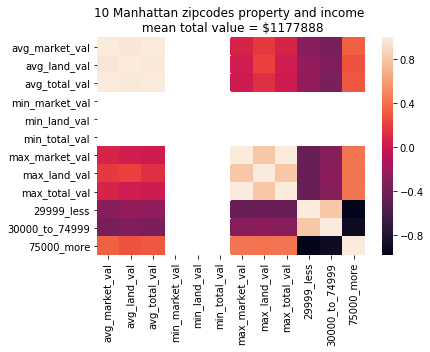

In [222]:
corrMat(manh.corr(),'10 Manhattan zipcodes property and income \n mean total value = $1177888')

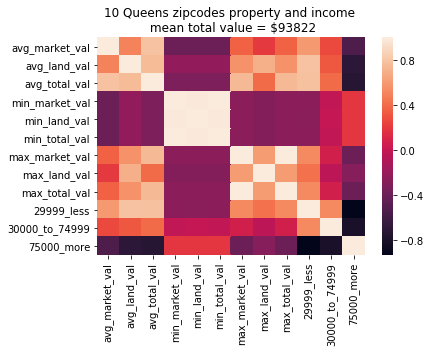

In [223]:
corrMat(queens.corr(),'10 Queens zipcodes property and income \n mean total value = $93822')

In [221]:
queens.corr()[np.abs(queens.corr())>0.3]

,avg_market_val,avg_land_val,avg_total_val,min_market_val,min_land_val,min_total_val,max_market_val,max_land_val,max_total_val,29999_less,30000_to_74999,75000_more
avg_market_val,1.000000,0.499563,0.793047,-0.398636,-0.400910,-0.398636,0.361694,NaN,0.361694,0.599250,NaN,-0.536619
avg_land_val,0.499563,1.000000,0.756776,NaN,NaN,NaN,0.569077,0.702018,0.569077,0.794705,0.325307,-0.699863
avg_total_val,0.793047,0.756776,1.000000,-0.315720,-0.317119,-0.315720,0.743761,0.399037,0.743761,0.788434,0.401872,-0.728383
min_market_val,-0.398636,NaN,-0.315720,1.000000,0.990689,1.000000,NaN,NaN,NaN,NaN,NaN,NaN
min_land_val,-0.400910,NaN,-0.317119,0.990689,1.000000,0.990689,NaN,NaN,NaN,NaN,NaN,NaN
min_total_val,-0.398636,NaN,-0.315720,1.000000,0.990689,1.000000,NaN,NaN,NaN,NaN,NaN,NaN
max_market_val,0.361694,0.569077,0.743761,NaN,NaN,NaN,1.000000,0.613344,1.000000,0.527322,NaN,-0.400870
max_land_val,NaN,0.702018,0.399037,NaN,NaN,NaN,0.613344,1.000000,0.613344,0.421425,NaN,NaN
max_total_val,0.361694,0.569077,0.743761,NaN,NaN,NaN,1.000000,0.613344,1.000000,0.527322,NaN,-0.400870
29999_less,0.599250,0.794705,0.788434,NaN,NaN,NaN,0.527322,0.421425,0.527322,1.000000,0.525431,-0.930600


In [186]:
corr_by_year(normalize(p1),normalize(i1),mutyear,tol = 0.5)

/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:141: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


2012 max_land_val 29999_less -0.504644912056
2014 max_market_val 29999_less -0.541481319619
2014 max_market_val 75000_more 0.508269078775
2014 max_total_val 29999_less -0.541481319587
2014 max_total_val 75000_more 0.508269078746


In [187]:
corr_by_year(normalize(p2),normalize(i2),mutyear,tol = 0.5)

/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:141: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


2015 avg_land_val 29999_less 0.743336814238
2015 avg_land_val 75000_more -0.697845722328
2015 avg_total_val 29999_less 0.703266663116
2015 avg_total_val 75000_more -0.599145725722
2015 max_market_val 29999_less 0.63249383189
2015 max_total_val 29999_less 0.63249383189
2013 avg_market_val 29999_less 0.766553979904
2013 avg_market_val 75000_more -0.628031102565
2013 avg_land_val 29999_less 0.754165661022
2013 avg_land_val 75000_more -0.662145482114
2013 avg_total_val 29999_less 0.827622141192
2013 avg_total_val 75000_more -0.742997458538
2013 max_market_val 29999_less 0.528961895931
2013 max_total_val 29999_less 0.528961895931
2012 avg_market_val 29999_less 0.750540241208
2012 avg_market_val 75000_more -0.663783039053
2012 avg_land_val 29999_less 0.829448845509
2012 avg_land_val 75000_more -0.717315016315
2012 avg_total_val 29999_less 0.852895749664
2012 avg_total_val 75000_more -0.782504034342
2012 max_market_val 29999_less 0.513032248383
2012 max_total_val 29999_less 0.513032248383
201

/anaconda3/lib/python3.6/site-packages/numpy/lib/function_base.py:3162: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/anaconda3/lib/python3.6/site-packages/numpy/lib/function_base.py:3163: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]


In [265]:
#education and property
corr_by_zip(edu_n,property_year_n,mutzip1,tol = 0.8)

/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:63: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:64: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
/anaconda3/lib/python3.6/site-packages/numpy/lib/function_base.py:3162: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/anaconda3/lib/python3.6/site-packages/numpy/lib/function_base.py:3163: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]


11217 percent_high_school avg_market_val 0.971435241329
11217 percent_high_school avg_land_val 0.882538909476
11217 percent_high_school avg_total_val 0.987276374572
11217 percent_high_school max_market_val 0.985704045589
11217 percent_high_school max_land_val 0.977156225571
11217 percent_high_school max_total_val 0.985704045611
11217 percent_bachelor avg_market_val 0.970592361993
11217 percent_bachelor avg_total_val 0.952194115449
11217 percent_bachelor max_market_val 0.964057074612
11217 percent_bachelor max_land_val 0.866388948585
11217 percent_bachelor max_total_val 0.964057074525
11237 percent_high_school avg_total_val 0.860188446328
11237 percent_high_school max_market_val 0.94306894916
11237 percent_high_school max_total_val 0.94306894916
11237 percent_bachelor avg_total_val 0.967429451593
11413 percent_high_school avg_total_val 0.935975024841
11413 percent_high_school max_market_val -0.811391191847
11413 percent_high_school max_land_val -0.811747175376
11413 percent_high_school 

10034 percent_high_school max_market_val 0.915404217241
10034 percent_high_school max_total_val 0.915404219517
30
11363 percent_high_school avg_total_val -0.996843070478
11363 percent_high_school max_market_val -0.849655980648
11363 percent_high_school max_land_val -0.849655980648
11363 percent_high_school max_total_val -0.849655980648
11363 percent_bachelor avg_total_val -0.953059145376
11363 median_earnings_bachelor avg_total_val 0.921903704517
10303 percent_bachelor avg_total_val 0.914007973512
10303 percent_bachelor max_market_val 0.82775387545
10303 percent_bachelor max_total_val 0.82775387545
11215 percent_high_school avg_market_val 0.815598071357
11215 percent_high_school avg_total_val 0.976734895593
11215 percent_high_school max_market_val 0.80186713996
11215 percent_high_school max_total_val 0.80186713996
11215 percent_bachelor avg_market_val 0.895793871265
11215 percent_bachelor avg_total_val 0.995377349225
11215 percent_bachelor max_market_val 0.88550821421
11215 percent_bac

11373 percent_bachelor avg_market_val 0.931525065529
11373 percent_bachelor avg_land_val 0.838878068578
11373 percent_bachelor avg_total_val 0.955066472221
11373 percent_bachelor max_market_val 0.917850044433
11373 percent_bachelor max_total_val 0.917850044433
10013 percent_high_school avg_total_val 0.894881644391
10013 percent_high_school max_market_val 0.921019897593
10013 percent_high_school max_land_val 0.97294278168
10013 percent_high_school max_total_val 0.921019897589
10013 percent_bachelor max_market_val 0.804016789496
10013 percent_bachelor max_land_val 0.947074303052
10013 percent_bachelor max_total_val 0.804016789197
10010 percent_bachelor avg_land_val 0.93002761757
10010 median_earnings_high_school avg_land_val -0.97080141087
10010 median_earnings_bachelor avg_land_val -0.962626417708
10462 percent_high_school avg_market_val 0.976359089572
10462 percent_high_school avg_land_val -0.909388708219
10462 percent_high_school avg_total_val 0.951366534316
10462 percent_high_school 

10456 percent_bachelor avg_total_val 0.994599173089
10456 percent_bachelor max_market_val 0.811638987418
10456 percent_bachelor max_land_val 0.864941739969
10456 percent_bachelor max_total_val 0.811638941136
11364 percent_high_school avg_land_val -0.95363153974
11364 percent_high_school max_land_val -0.849089513898
11364 percent_bachelor avg_market_val 0.890040702618
11364 percent_bachelor avg_total_val 0.962936520436
10310 percent_bachelor avg_market_val -0.873074112782
10075 percent_high_school avg_land_val -0.940321856613
10075 percent_bachelor avg_market_val 0.862916919362
10075 percent_bachelor avg_total_val 0.866012258522
10075 percent_bachelor max_land_val 0.901503760447
10075 median_earnings_high_school avg_market_val 0.839691640096
10075 median_earnings_bachelor avg_market_val 0.831714362053
11421 percent_high_school avg_total_val -0.877882642122
90
11230 percent_bachelor avg_market_val 0.888941390808
10040 percent_high_school max_land_val 0.847998304005
11377 percent_high_sch

11211 percent_bachelor avg_land_val 0.819208221872
11211 percent_bachelor avg_total_val 0.925465229289
11211 percent_bachelor max_market_val -0.929167852425
11211 percent_bachelor max_land_val -0.888912385485
11211 percent_bachelor max_total_val -0.929167852425
11432 percent_bachelor max_land_val 0.801192744802
11694 percent_bachelor max_land_val -0.823376145965
11427 percent_bachelor max_market_val -0.890792945261
11427 percent_bachelor max_total_val -0.890792945261
11426 median_earnings_high_school avg_land_val 0.862749165443
11378 percent_high_school avg_market_val 0.904457986177
11378 percent_high_school avg_land_val -0.905323316163
11378 percent_high_school avg_total_val 0.94957453421
11378 percent_high_school max_market_val 0.97299134458
11378 percent_high_school max_total_val 0.97299134458
11378 percent_bachelor avg_market_val 0.946918282669
11378 percent_bachelor avg_land_val -0.892223619835
11378 percent_bachelor avg_total_val 0.963775134787
11378 percent_bachelor max_market_v

11236 percent_bachelor max_total_val -0.915189903274
11361 percent_high_school avg_market_val 0.803566372094
11361 percent_high_school avg_total_val 0.884630958339
11361 percent_high_school max_land_val -0.851163243083
11361 percent_bachelor avg_market_val 0.96954537973
11361 percent_bachelor avg_total_val 0.917312052128
11361 percent_bachelor max_market_val 0.86678329545
11361 percent_bachelor max_total_val 0.86678329545
10282 median_earnings_high_school avg_market_val -0.994522226505
10282 median_earnings_high_school avg_total_val -0.994522226412
10282 median_earnings_high_school max_land_val 0.988592850092
10282 median_earnings_bachelor avg_market_val -0.968502353205
10282 median_earnings_bachelor avg_land_val -0.882780980608
10282 median_earnings_bachelor avg_total_val -0.96850235276
10282 median_earnings_bachelor max_land_val 0.989342643646
11692 percent_high_school avg_market_val 0.885212245609
11210 percent_high_school max_land_val 0.89072354283
11210 percent_bachelor avg_total_

In [151]:
comp_property = complaints_year.merge(property_year,'inner',on = ['year','zip_code'])
crime_year['zip_code'] = crime_year['zip_code'].astype(str)
crim_comp_prop = comp_property.merge(crime_year,'inner',on = ['year','zip_code'])
crim_comp_prop.head()

,year,zip_code,comp_count,avg_market_val,avg_land_val,avg_total_val,min_market_val,min_land_val,min_total_val,max_market_val,max_land_val,max_total_val,FELONY,MISDEMEANOR,VIOLATION
0,2011,10001,5.637295,5.900805e+06,884297.885430,2.585099e+06,0.0,0.0,0.0,698700000.0,99000000.0,314415000.0,2156,5225,350
1,2011,10001,5.391720,5.900805e+06,884297.885430,2.585099e+06,0.0,0.0,0.0,698700000.0,99000000.0,314415000.0,2156,5225,350
2,2011,10002,7.427648,1.701034e+06,280133.760945,6.810973e+05,0.0,0.0,0.0,247291650.0,111281243.0,111281243.0,1322,3016,508
3,2011,10002,9.312169,1.701034e+06,280133.760945,6.810973e+05,0.0,0.0,0.0,247291650.0,111281243.0,111281243.0,1322,3016,508
4,2011,10003,7.236318,2.595515e+06,288323.391382,9.245300e+05,0.0,0.0,0.0,183000000.0,24615000.0,82350000.0,1586,3143,374


In [202]:
#complaint, crime, property by borough
crim_comp_prop_borough = crim_comp_prop.merge(borough,'inner','zip_code')
crim_comp_prop_borough.drop('zip_code',axis = 1, inplace = True)

In [204]:
crim_comp_prop_borough_n = normalize(crim_comp_prop_borough)

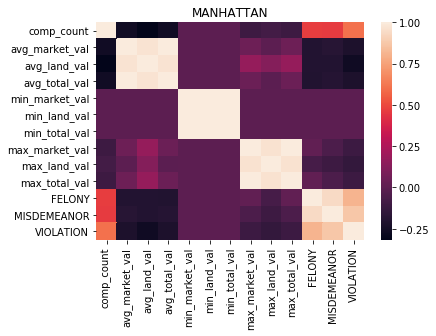

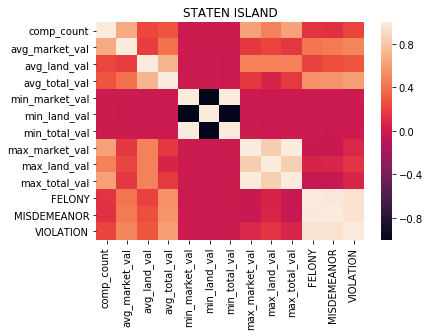

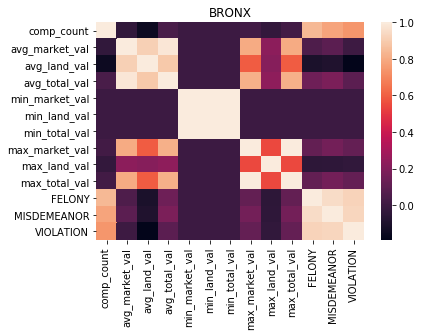

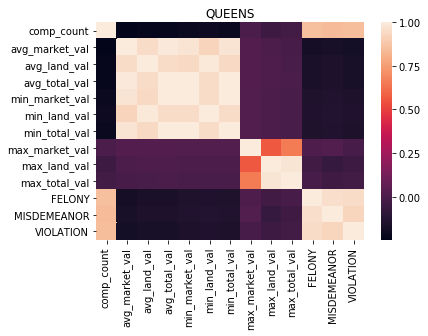

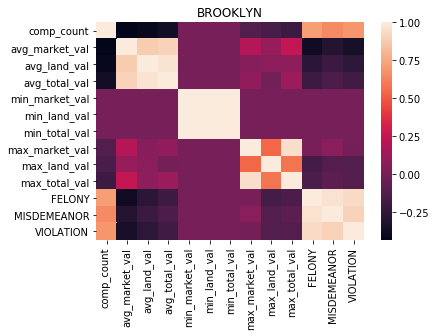

In [205]:
for b in crim_comp_prop_borough_n.borough.unique():
    cur = crim_comp_prop_borough_n[crim_comp_prop_borough_n['borough'] == b]
    corrMat(cur.corr(),b)

In [207]:
crim_comp_prop_borough_n.borough.unique()

array(['MANHATTAN', 'STATEN ISLAND', 'BRONX', 'QUEENS', 'BROOKLYN'], dtype=object)

In [208]:

cur = crim_comp_prop_borough_n[crim_comp_prop_borough_n['borough'] == 'STATEN ISLAND']
cur.corr()[np.abs(cur.corr())>0.5]
    

,comp_count,avg_market_val,avg_land_val,avg_total_val,min_market_val,min_land_val,min_total_val,max_market_val,max_land_val,max_total_val,FELONY,MISDEMEANOR,VIOLATION
comp_count,1.000000,0.669515,NaN,NaN,NaN,NaN,NaN,0.620401,NaN,0.622277,NaN,NaN,NaN
avg_market_val,0.669515,1.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
avg_land_val,NaN,NaN,1.000000,0.712312,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
avg_total_val,NaN,NaN,0.712312,1.000000,NaN,NaN,NaN,NaN,NaN,NaN,0.542223,0.556554,0.605817
min_market_val,NaN,NaN,NaN,NaN,1.0,-1.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN
min_land_val,NaN,NaN,NaN,NaN,-1.0,1.0,-1.0,NaN,NaN,NaN,NaN,NaN,NaN
min_total_val,NaN,NaN,NaN,NaN,1.0,-1.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN
max_market_val,0.620401,NaN,NaN,NaN,NaN,NaN,NaN,1.000000,0.843341,0.998964,NaN,NaN,NaN
max_land_val,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.843341,1.000000,0.846387,NaN,NaN,NaN
max_total_val,0.622277,NaN,NaN,NaN,NaN,NaN,NaN,0.998964,0.846387,1.000000,NaN,NaN,NaN


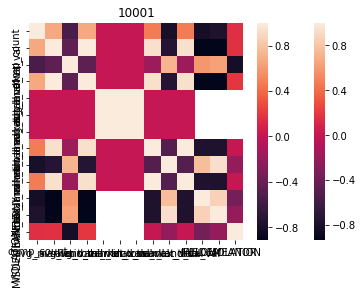

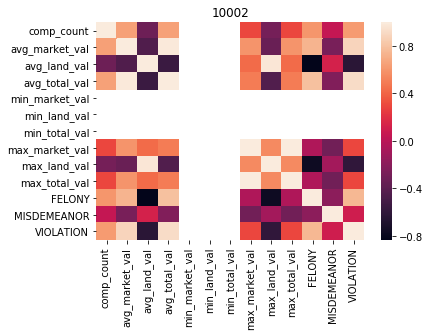

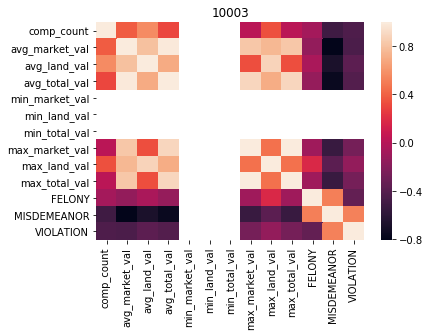

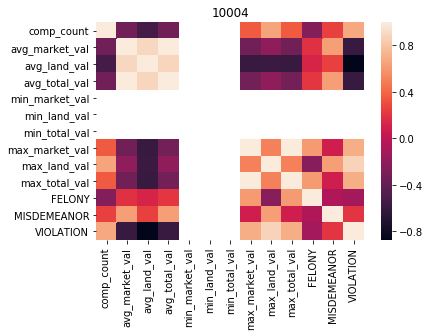

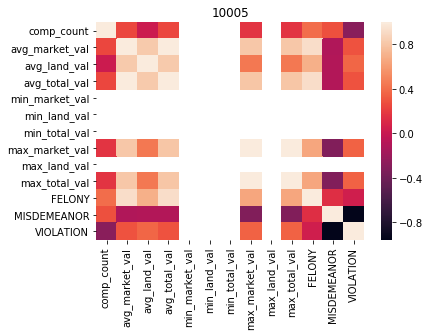

...

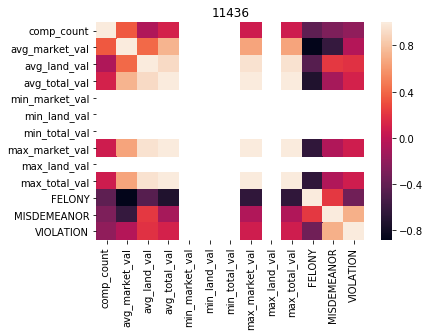

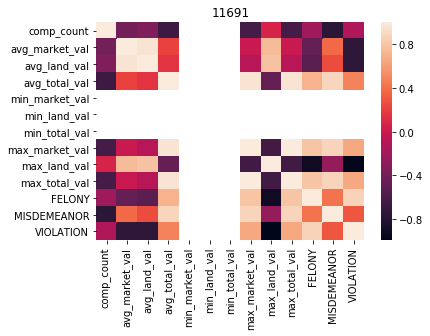

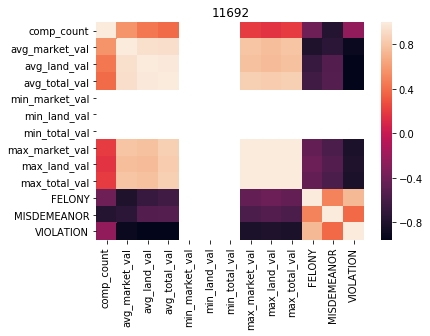

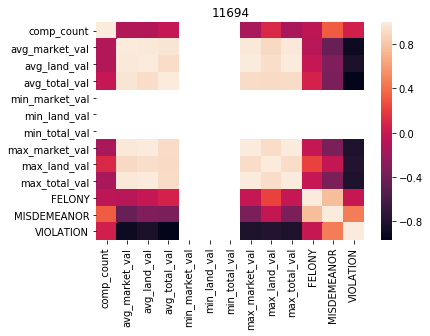

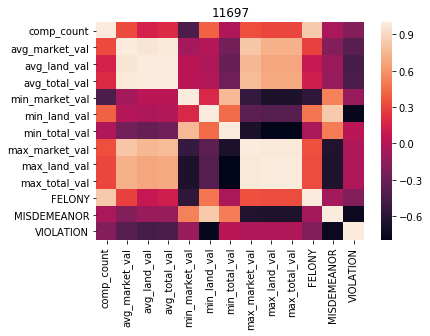

In [153]:
for zc in crim_comp_prop.zip_code.unique():
    subset = crim_comp_prop[crim_comp_prop['zip_code']==zc]
    corrMat(subset.corr(),zc)

In [156]:
#complaints and property
corr_by_zip(complaints_year_n,property_year_n, mutzip1, tol = 0.8)

/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:60: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
/anaconda3/lib/python3.6/site-packages/numpy/lib/function_base.py:3162: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/anaconda3/lib/python3.6/site-packages/numpy/lib/function_base.py:3163: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]


11237 comp_count avg_land_val -0.803396027081
11365 comp_count avg_total_val 0.859562457987
11228 comp_count avg_land_val -0.824003607409
10
11374 comp_count max_land_val -0.836529462347
20
11370 comp_count avg_market_val 0.884037604582
11370 comp_count avg_land_val 0.874283346691
11370 comp_count avg_total_val 0.879723088688
11370 comp_count max_market_val 0.87789941287
11370 comp_count max_land_val 0.871627114841
11370 comp_count max_total_val 0.87789941287
11234 comp_count avg_land_val -0.879825506214
30
11366 comp_count avg_market_val 0.803826281667
40
11229 comp_count avg_land_val -0.874289017886
50
11223 comp_count avg_land_val -0.814964543309
11223 comp_count max_land_val -0.820225023451
60
70
11101 comp_count avg_market_val 0.817596272344
11101 comp_count avg_total_val 0.850204879202
11101 comp_count max_market_val 0.824252059666
11101 comp_count max_total_val 0.824252059666
10471 comp_count avg_market_val 0.801525335266
10471 comp_count avg_total_val 0.802161957447
10471 comp_

In [158]:
#complaints and income
corr_by_zip(complaints_year_n,income_n, mutzip1,tol = 0.8)

/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:60: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


11228 comp_count 30000_to_74999 -0.833668731794
10
11374 comp_count 29999_less 0.9434169944
11374 comp_count 30000_to_74999 -0.941999286248
20
11370 comp_count 30000_to_74999 -0.925849370314
11370 comp_count 75000_more 0.877288521593
11234 comp_count total_with_income 0.839193337155
11234 comp_count 29999_less -0.858421323856
30
11366 comp_count total_with_income -0.871021838566
11366 comp_count 30000_to_74999 0.815528693922
40
50
60
70
11206 comp_count total_with_income 0.82404859008
11206 comp_count 29999_less -0.811177301772
11206 comp_count 30000_to_74999 -0.849309177486
11206 comp_count 75000_more 0.851252119961
80
11205 comp_count total_with_income 0.933078088681
11205 comp_count 29999_less -0.936483221379
90
11201 comp_count total_with_income 0.856162489353
11201 comp_count 30000_to_74999 -0.860313685777
11201 comp_count 75000_more -0.851382923311
100
10465 comp_count 29999_less -0.879027235675
10465 comp_count 30000_to_74999 -0.901557402547
11356 comp_count 29999_less 0.9237225

In [98]:
corr_by_zip(complaints_year_n,edu_n, mutzip1,tol = 0.9)

/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:60: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


10
20
30
40
50
60
70
80
11205 comp_count percent_bachelor 0.954477702451
90
10023 comp_count percent_high_school 0.910192842842
10023 comp_count median_earnings_high_school 0.947497912232
10023 comp_count median_earnings_bachelor 0.942698550028
100
110
120
10016 comp_count median_earnings_high_school 0.960239764437
10016 comp_count median_earnings_bachelor 0.964435887424
130
140
150


/anaconda3/lib/python3.6/site-packages/numpy/lib/function_base.py:3162: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/anaconda3/lib/python3.6/site-packages/numpy/lib/function_base.py:3163: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]


160
170


In [167]:
crime_year['total_crime'] = crime_year['FELONY'] + crime_year['MISDEMEANOR'] + crime_year['VIOLATION']
crime_year_n = normalize(crime_year)

In [168]:
#crime and complaints
corr_by_zip(crime_year_n, complaints_year_n,mutzip1,tol = 0.8)

/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:60: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


10
11374 FELONY comp_count -0.908777837437
20
11234 FELONY comp_count -0.892034659183
30
11366 VIOLATION comp_count 0.848957172016
40
50
60
70
80
11205 VIOLATION comp_count 0.822758733034
90
11201 MISDEMEANOR comp_count -0.83753027363
11201 total_crime comp_count -0.814900216599
11697 FELONY comp_count 0.839121064537
100
10465 VIOLATION comp_count 0.929486648926
10001 FELONY comp_count -0.808295603605
110
120
10029 FELONY comp_count 0.86644128779
10029 VIOLATION comp_count 0.85237877136
10029 total_crime comp_count 0.810026825455
130
140
150
160
170
11379 MISDEMEANOR comp_count -0.807729075272
11379 total_crime comp_count -0.832348298895
10024 VIOLATION comp_count 0.803240430657


In [100]:
#crime and property
corr_by_zip(crime_year_n,property_year_n,mutzip1,0.8)

/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:60: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
/anaconda3/lib/python3.6/site-packages/numpy/lib/function_base.py:3162: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/anaconda3/lib/python3.6/site-packages/numpy/lib/function_base.py:3163: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]


11217 FELONY avg_land_val 0.917024768353
11217 FELONY avg_total_val 0.800612958805
11217 FELONY max_land_val 0.910544263915
11217 MISDEMEANOR avg_market_val -0.938779986874
11217 MISDEMEANOR avg_total_val -0.899921378474
11217 MISDEMEANOR max_market_val -0.975542739966
11217 MISDEMEANOR max_land_val -0.934828241342
11217 MISDEMEANOR max_total_val -0.975542740012
11237 MISDEMEANOR avg_total_val -0.860719568902
11237 MISDEMEANOR max_market_val -0.948048374086
11237 MISDEMEANOR max_total_val -0.948048374086
11413 MISDEMEANOR avg_market_val 0.805477244892
11413 MISDEMEANOR avg_total_val 0.944078675212
11413 VIOLATION avg_market_val 0.855445586117
11413 VIOLATION avg_total_val 0.907354959727
11224 VIOLATION avg_land_val -0.948357708396
11228 FELONY avg_market_val 0.838094799336
11228 FELONY avg_total_val 0.914695361088
11228 MISDEMEANOR max_market_val -0.847389482217
11228 MISDEMEANOR max_total_val -0.847389482217
11428 FELONY avg_market_val 0.89067317195
11428 VIOLATION avg_market_val 0.82

11207 VIOLATION max_total_val 0.893781437272
11223 FELONY avg_land_val -0.827322091352
11223 FELONY avg_total_val 0.943054139028
11223 FELONY max_land_val -0.812936424871
60
11373 FELONY avg_total_val -0.804690537942
11373 VIOLATION avg_land_val 0.883011713717
10013 MISDEMEANOR avg_market_val -0.960920888168
10013 MISDEMEANOR avg_total_val -0.897536023428
10013 MISDEMEANOR max_market_val -0.9225877107
10013 MISDEMEANOR max_total_val -0.92258771057
10010 FELONY avg_land_val -0.855977517402
10010 MISDEMEANOR avg_land_val -0.82519028059
10462 FELONY avg_market_val -0.827441609793
10462 FELONY max_land_val -0.819415742424
10462 MISDEMEANOR max_land_val -0.971848801873
11216 MISDEMEANOR avg_total_val -0.929959278463
11216 MISDEMEANOR max_market_val -0.971450208513
11216 MISDEMEANOR max_total_val -0.971450208513
11233 FELONY avg_market_val -0.992326369058
11233 MISDEMEANOR avg_land_val -0.935311948373
11233 MISDEMEANOR avg_total_val -0.976730173906
11233 MISDEMEANOR max_market_val 0.82053416

10016 FELONY avg_market_val 0.919937199603
10016 FELONY avg_total_val 0.922425337433
10016 FELONY max_market_val 0.893878922672
10016 FELONY max_total_val 0.893878922672
10016 MISDEMEANOR avg_land_val 0.950605523913
10016 VIOLATION max_land_val 0.841730590603
130
11225 FELONY avg_total_val 0.876718198444
10036 FELONY avg_land_val -0.899495083238
10036 VIOLATION avg_land_val -0.983928086033
10036 VIOLATION max_land_val -0.862645606014
10019 FELONY avg_market_val 0.890595330359
10019 FELONY avg_total_val 0.896347819708
10019 FELONY max_market_val 0.802824123654
10019 FELONY max_total_val 0.80282412361
10019 VIOLATION avg_market_val 0.988064692423
10019 VIOLATION avg_land_val -0.856443703377
10019 VIOLATION avg_total_val 0.989362587619
10019 VIOLATION max_market_val 0.98158164744
10019 VIOLATION max_total_val 0.981581647499
10011 MISDEMEANOR avg_land_val 0.843472983312
10011 MISDEMEANOR max_market_val -0.897185859136
10011 MISDEMEANOR max_total_val -0.897185859136
10011 VIOLATION avg_mark

In [ ]:
#crime and complaint by year/month

In [238]:
corr_by_zip2(crime_month_n,complaints_month_n,mutzip1,0.4)

/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:95: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


10
20
30
40
50
60
70
80
90
100
110
120
130
140
150
160
170


BY YEAR

In [31]:
#crime_year_n.columns = ['date','month_of_year','crime_type','crime_count']
#crime_year_n.head()

,year,zip_code,FELONY,MISDEMEANOR,VIOLATION
1,2011,10001,2.264141,3.166186,0.104199
2,2011,10002,0.864373,1.293176,0.743526
3,2011,10003,1.307465,1.400859,0.201312
4,2011,10004,-1.114436,-1.041939,-1.166364
5,2011,10005,-1.218496,-1.118250,-1.166364


In [36]:
crime.head()

,month,zip_code,FELONY,MISDEMEANOR,VIOLATION
0,2011/4,11209,0,78,0
1,2015/10,11213,0,90,0
2,2011/7,10018,52,0,0
3,2014/3,10473,0,104,0
4,2013/3,11419,0,44,0


In [125]:
df_year = property_y.copy()
dates = list(df_year['year'])
years = [str(x)[:2] + str(x)[5:7] for x in dates]
df_year['year'] = years
property_year = df_year.copy()
#group by year
property_year = property_year.groupby(['year','zip_code'],as_index = False).mean()
len(property_year.year)

1598

In [37]:
'''
df_year = crime_year_n.copy()
dates = list(df_year['month'])
years = [str(x)[:4] for x in dates]
df_year['year'] = years
crime_year = df_year.copy()
#group by year
crime_year = crime_year.groupby(['year','month_of_year'],as_index = False).sum()
crime_year.head()
'''

"\ndf_year = crime_year_n.copy()\ndates = list(df_year['month'])\nyears = [str(x)[:4] for x in dates]\ndf_year['year'] = years\ncrime_year = df_year.copy()\n#group by year\ncrime_year = crime_year.groupby(['year','month_of_year'],as_index = False).sum()\ncrime_year.head()\n"

In [126]:
corr_by_year(edu_n,property_year_n, mutual_year = mutyear, tol = 0.5)

/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:141: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


In [236]:
def draw_corr(df1,df2,year,label): 
    
    
    df1['year'] = df1['year'].astype(int).astype(str)
    df2['year'] = df2['year'].astype(int).astype(str)
    complaints_2015 = df1[df1['year'] == year]
    complaints_2015.drop(['year'], axis = 1, inplace = True)
    
    crime_2015 = df2[df2['year'] == '2015']
    crime_2015.drop(['year'], axis = 1, inplace = True)
    complaints_2015['zip_code'] = complaints_2015['zip_code'].astype(str)
    crime_2015['zip_code'] = crime_2015['zip_code'].astype(str)
    cc2015 = complaints_2015.merge(crime_2015,'inner',on = 'zip_code')
    cc2015.drop('zip_code',axis = 1,inplace = True)
    
    plt.figure(figsize = ((15,10)))
    sns.heatmap(normalize(cc2015).corr(),fmt='6g')
    plt.title(label,size = 20)
    plt.savefig(label)
    plt.show()
    
    return cc2015

In [149]:
income['75000_more'] = income['75000_more']*100
income['29999_less'] = income['29999_less']*100
income['30000_to_74999'] = income['30000_to_74999']*100

In [135]:
#income and education
corr_by_year(income_n,edu_n,mutual_year = mutyear,tol = 0.8,print_all = False)

/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:141: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


2015 75000_more percent_high_school 0.817287618972
2013 29999_less percent_high_school -0.820603433383
2013 75000_more percent_high_school 0.856218946693
2013 75000_more percent_bachelor 0.824679609381
2013 75000_more median_earnings_high_school 0.851838934218
2013 75000_more median_earnings_bachelor 0.820051841416
2012 29999_less percent_high_school -0.826669006938
2012 75000_more percent_high_school 0.859236917272
2012 75000_more percent_bachelor 0.809465825286
2012 75000_more median_earnings_bachelor 0.801970801787
2014 29999_less percent_high_school -0.831373340828
2014 30000_to_74999 median_earnings_high_school -0.817667232821
2014 75000_more percent_high_school 0.859918018141
2014 75000_more percent_bachelor 0.834758491831
2014 75000_more median_earnings_high_school 0.837545014069
2014 75000_more median_earnings_bachelor 0.805557162238
2011 29999_less percent_high_school -0.825451419068
2011 75000_more percent_high_school 0.856989046435
2011 75000_more percent_bachelor 0.81346566

In [148]:
ie2015.columns

Index(['29999_less', '30000_to_74999', '75000_more', 'percent_high_school',
       'percent_bachelor', 'median_earnings_high_school',
       'median_earnings_bachelor'],
      dtype='object')

/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  
/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':
/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  # Remove the CWD from sys.path while we load stuff.
/anaconda3/lib/python3

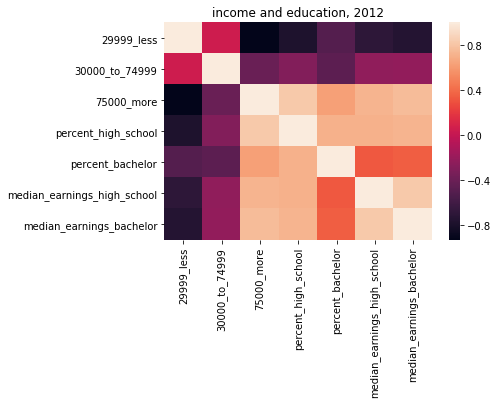

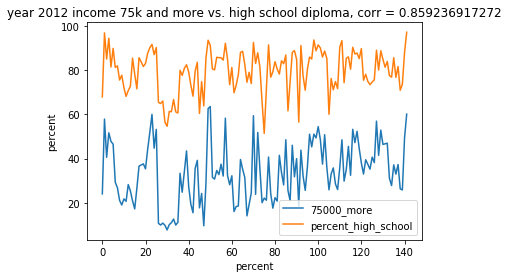

In [166]:
ie2015 = draw_corr(income,education,'2012','income and education, 2012')
#ie2015.drop('total_with_income',axis =1,inplace = True)
#ie2015_sub = ie2015[
'''
plt.scatter(ie2015['percent_high_school'],ie2015['29999_less']*100)
plt.xlabel('percent_high_school')
plt.ylabel('percent population with income 29999_less')
plt.title('corr = -0.826669006938')
#plt.xlim((0,0.0125))
plt.savefig('inc_edu_1_noNorm')
plt.show()

plt.scatter(ie2015['percent_bachelor'],ie2015['75000_more']*100)
plt.xlabel('percent_bachelor')
plt.ylabel('percent population with income 75000_more')
#plt.xlim((0,0.0125))
plt.title('corr = 0.809465825286')
plt.savefig('inc_edu_2_noNorm')
'''
ie2015_sub = ie2015[['75000_more', 'percent_high_school']]
plt.plot(ie2015_sub)
plt.title('year 2012 income 75k and more vs. high school diploma, corr = 0.859236917272')
plt.xlabel('percent')
plt.ylabel('percent')
plt.legend(ie2015_sub.columns)
plt.savefig('inc_edu_plot')



#plt.plot(ie2015)
plt.show()



/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  import sys
/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  # Remove the CWD from sys.path while we load stuff.
/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  # This is added back by InteractiveShe

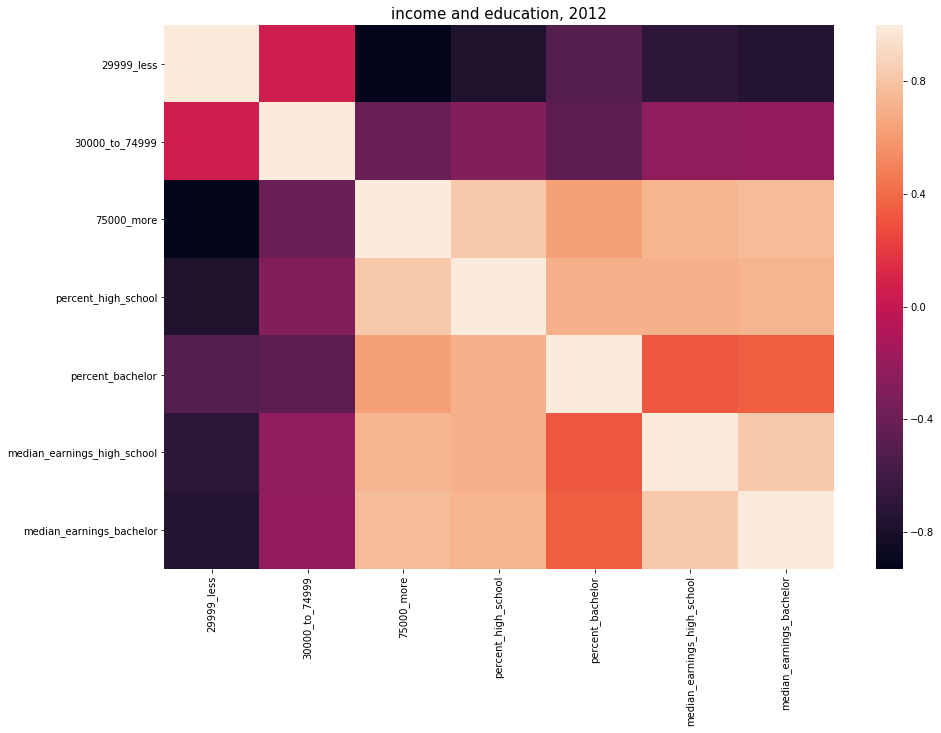

In [228]:
ie2015 = draw_corr(income,education,'2012','income and education, 2012')

In [229]:
ie2015_sub.head()

,75000_more,percent_high_school
0,24.058564,67.9
1,57.849953,96.8
2,40.589455,85.0
3,51.646299,94.4
4,47.782975,81.4


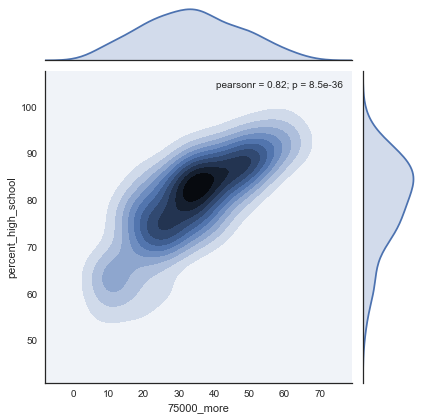

In [255]:
ie2015_sub = ie2015[['75000_more', 'percent_high_school']]

plt.figure(figsize=(25,20))
with sns.axes_style('white'):
    sns.jointplot('75000_more', 'percent_high_school', ie2015_sub, kind='kde')
plt.savefig('temp_complaint_2',dpi = 500)   

In [139]:
#complaint and edu
corr_by_year(complaints_year_n,edu_n,mutual_year = mutyear,tol = 0.5,print_all = False)

/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:141: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


2015 comp_count median_earnings_bachelor -0.549854080913
2013 comp_count percent_high_school -0.542802291344
2012 comp_count percent_high_school -0.555609813638
2012 comp_count median_earnings_bachelor -0.531471550445
2014 comp_count percent_high_school -0.565339787179
2011 comp_count percent_high_school -0.562299846468
2011 comp_count median_earnings_bachelor -0.505536118795


/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  import sys
/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  # Remove the CWD from sys.path while we load stuff.
/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  # This is added back by InteractiveShe

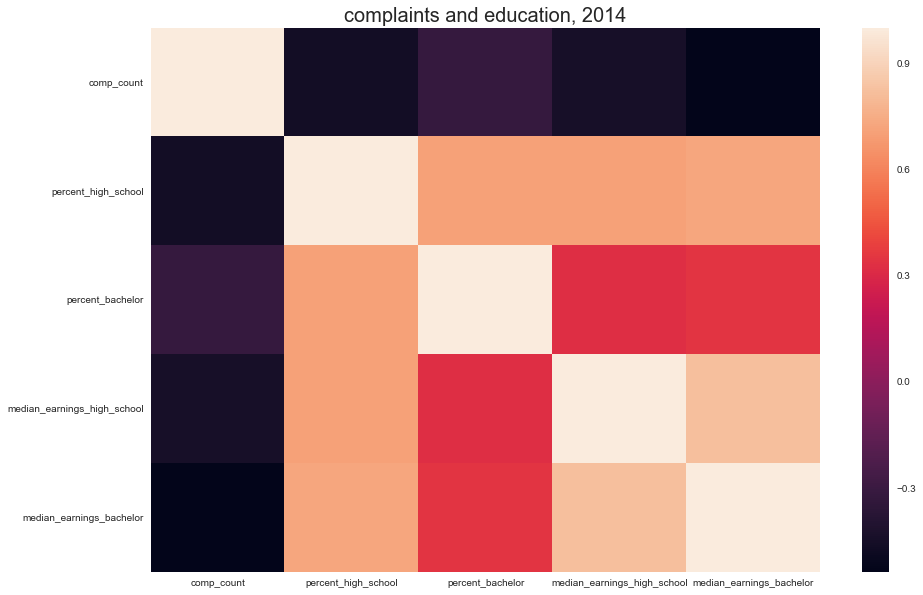

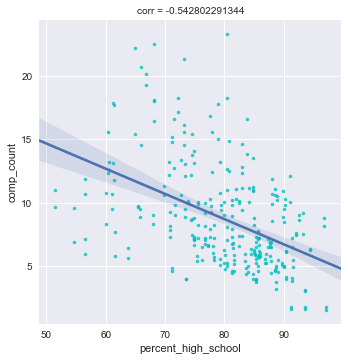

In [280]:
ce15 = draw_corr(complaints_year,education,'2014','complaints and education, 2014')



    
plt.figure(figsize = (20,40))
g = sns.lmplot('percent_high_school', 'comp_count',ce15,
               markers=".", scatter_kws=dict(color='c'))
plt.title('corr = -0.542802291344',size = 10)
#plt.legend('corr = -0.542802291344')
plt.savefig('felony_comp_14',dpi = 500)



plt.savefig('complaints_education_14',dpi = 1000)
plt.show()

In [173]:
income_n.head()

,year,zip_code,total_with_income,29999_less,30000_to_74999,75000_more
1,2011,10001,10473,-0.144288,-0.200935,-0.201579
2,2011,10002,32573,-0.327979,-0.320864,-0.289902
3,2011,10003,27326,-0.343936,-0.317239,-0.278746
4,2011,10004,1453,4.440605,1.899152,7.922090
5,2011,10005,2772,1.046181,1.065159,1.661069


In [105]:
#crime and complaints
corr_by_year(complaints_year_n,crime_year_n,mutual_year = mutyear,tol = 0.5,print_all = False)

/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:141: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


2015 comp_count FELONY 0.738464751714
2015 comp_count MISDEMEANOR 0.728230633595
2015 comp_count VIOLATION 0.762493256821
2013 comp_count FELONY 0.73534923307
2013 comp_count MISDEMEANOR 0.737309788178
2013 comp_count VIOLATION 0.764541217958
2012 comp_count FELONY 0.748663289429
2012 comp_count MISDEMEANOR 0.737075987069
2012 comp_count VIOLATION 0.774853090073
2014 comp_count FELONY 0.731542413043
2014 comp_count MISDEMEANOR 0.735130501228
2014 comp_count VIOLATION 0.749920046016
2011 comp_count FELONY 0.766273708754
2011 comp_count MISDEMEANOR 0.756618045467
2011 comp_count VIOLATION 0.7773825675


In [48]:
crime_year_n = normalize(crime_year)
crime_year_n['FELONY'].mean()

-1.084990683156403e-17

/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  import sys
/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  # Remove the CWD from sys.path while we load stuff.
/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  # This is added back by InteractiveShe

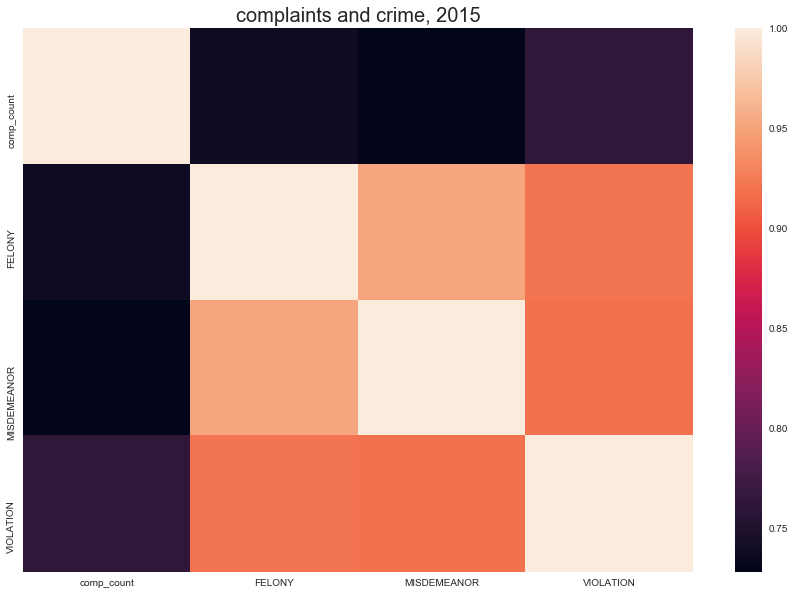

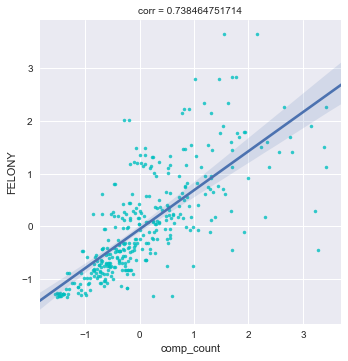

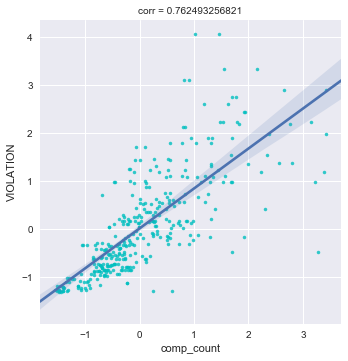

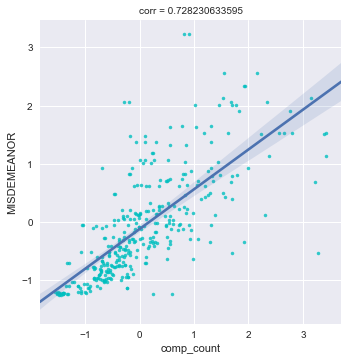

In [286]:
cc2014 = draw_corr(complaints_year_n,crime_year_n,'2015','complaints and crime, 2015')
#cc2014 = (cc2014 - cc2014.mean()) / (cc2014.max() - cc2014.min())
#cc2014 = (cc2014 - cc2014.mean()) / cc2014.std()
#cc2014 = normalize(cc2014)
'''
plt.plot(cc2014)
plt.legend(cc2014.columns)
plt.xlabel('count')
plt.ylabel('count')
#plt.ylim((0,1000))
plt.title('complaints and crime, 2015,normalized \n Complaints with FELONY: 0.738464751714 \n Complaints with MISDEMEANOR: 0.728230633595 \n Complaints with VIOLATION: 0.762493256821')
plt.savefig('complaints_crime_15')
'''
plt.figure(figsize = (25,100))
g = sns.lmplot('comp_count', 'FELONY', data=cc2014,
               markers=".", scatter_kws=dict(color='c'))
plt.title('corr = 0.738464751714',size = 10)
plt.savefig('felony_comp_14',dpi = 500)

plt.figure(figsize = (25,100))
g = sns.lmplot( 'comp_count','VIOLATION', data=cc2014,
               markers=".", scatter_kws=dict(color='c'))
plt.title('corr = 0.762493256821',size = 10)
plt.savefig('violation_comp_14',dpi = 500)

plt.figure(figsize = (25,100))
g = sns.lmplot( 'comp_count','MISDEMEANOR', data=cc2014,
               markers=".", scatter_kws=dict(color='c'))
plt.title('corr = 0.728230633595',size = 10)
plt.savefig('misde_comp_14',dpi = 500)
plt.show()

In [340]:
income_n = normalize(income)
edu_n = normalize(education)

In [267]:
#crime and education
corr_by_year(edu_n,crime_year_n,mutual_year = mutyear,tol = 0.5,print_all = False)

/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:141: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


2015 median_earnings_bachelor FELONY -0.521369106011
2015 median_earnings_bachelor MISDEMEANOR -0.538788038429
2013 percent_high_school VIOLATION -0.539300471333
2012 percent_high_school VIOLATION -0.507152367453
2014 percent_high_school MISDEMEANOR -0.527944678801
2014 percent_high_school VIOLATION -0.521646909447
2011 percent_high_school VIOLATION -0.539202679595


/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  import sys
/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  # Remove the CWD from sys.path while we load stuff.
/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  # This is added back by InteractiveShe

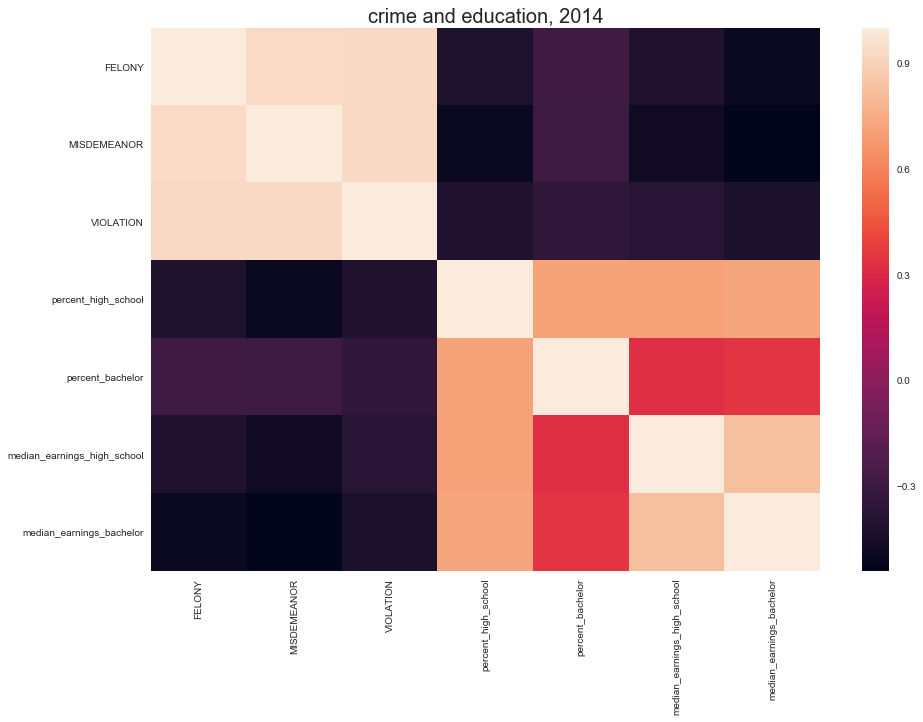

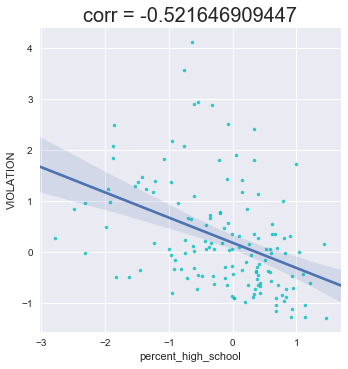

In [272]:
ce14 = draw_corr(crime_year_n,edu_n,'2014','crime and education, 2014')

'''
s1 = plt.scatter(ce14['percent_high_school'],ce14['VIOLATION'])
plt.xlabel('percent of population with high school diploma or higher')
#plt.ylabel('violation count')

plt.title('Education and Number of Crimes, not normalized')

s2 = plt.scatter(ce14['percent_high_school'],ce14['MISDEMEANOR'])
plt.xlabel('percent of population with high school diploma or higher')
plt.ylabel('crime count')
plt.legend([s1,s2],['violation, cor = -0.521646909447','misdemeanor, cor = -0.527944678801'])
plt.savefig('crime_edu_2_noNorm')
'''

plt.figure(figsize = (25,20))
g = sns.lmplot('percent_high_school', 'VIOLATION',ce14,
               markers=".", scatter_kws=dict(color='c'))
plt.title('corr = -0.521646909447',size = 20)
plt.savefig('violation_comp_14',dpi = 500)



plt.show()



In [160]:
corr_by_year(income_n,property_year_n, mutual_year = mutyear, tol = 0.4)

/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:141: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


In [68]:
years = list(['2011','2012','2013','2014','2015','2016','2017'])
property_year_2 = property_year[property_year['year'].isin(years)]

/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  
/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':
/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  # Remove the CWD from sys.path while we load stuff.
/anaconda3/lib/python3

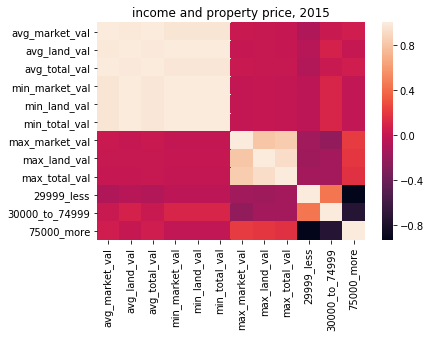

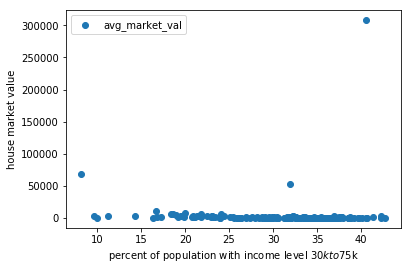

In [162]:
ip = draw_corr(property_year_2,income,'2015','income and property price, 2015')


plt.scatter(ip['30000_to_74999'],ip['avg_market_val']/1000)
plt.xlabel('percent of population with income level $30k to $75k')
#plt.ylabel('violation count')
plt.ylabel('house market value')
#plt.ylim(0,10000)
#plt.xlim(0,0.01)


#plt.legend([s1,s2],['avg_market_val, cor = 0.639846530759','min_market_val, cor = 0.585387874339'])
plt.legend()
#plt.ylim(0,100000)
plt.savefig('inc_prop_1')

'''
ip2 = ip[['avg_market_val', 'avg_land_val', 'avg_total_val', 'min_market_val',
       'min_land_val', 'min_total_val', '29999_less', '30000_to_74999',
       '75000_more']]
'''

plt.show()



In [73]:
income['30000_to_74999'].mean()

2.7943716607907613e-05